# Image Capture using VGG16 + Attention #

## Data ##
In google My Drive I have:

- Flickr8k_Dataset.zip
- Flickr8k_text.zip
- glove.6B.zip

##VGG16 Pre-trained Model##
This is based on https://github.com/SubhamIO/Image-Captioning-using-Attention-Mechanism-Local-Attention-and-Global-Attention-/blob/master/Image_Captioning_using_Attention_Mechanism.ipynb

In [0]:
try:
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf
print(tf.__version__)

2.2.0


In [4]:
!ls -a '/root/.keras/datasets/'
#!ls -a '/content/drive/My Drive/'

ls: cannot access '/root/.keras/datasets/': No such file or directory


# Mounting the Drive
Zipped image and text files are stored in Google My Drive, so first the drive is mounted and then the files are downloaded, accessible in /root/.keras/datasets/

In [1]:
%tensorflow_version 2.x
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [2]:
# Python Libraries
import numpy as np
from numpy import array
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import string
from PIL import Image
import glob
import pickle #import dump, load
from time import time
import tensorflow as tf

from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Embedding, TimeDistributed, Dense, RepeatVector,\
                         Activation, Flatten, Reshape, Concatenate, Dropout, BatchNormalization, add, Add
from tensorflow.keras.layers import Conv2D, MaxPool2D
from tensorflow.keras.layers import Bidirectional
from tensorflow.keras.optimizers import Adam, RMSprop
#from tensorflow.keras.applications.inception_v3 import InceptionV3
#from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import Input, layers
from tensorflow.keras import optimizers
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from keras.backend.tensorflow_backend import set_session, repeat_elements

from collections import Counter 
import seaborn as sns
import sys, os, warnings 
import re
from pickle import load
from pickle import dump
import datetime

# Scikit-learn includes many helpful utilities
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

Using TensorFlow backend.
/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [3]:
# Read the Images to Keras/datasets
import tensorflow as tf
file_url = 'file:///content/drive/My Drive/Flickr8k_Dataset.zip'
zip_dir = tf.keras.utils.get_file('Flickr8k_Dataset.zip', origin=file_url, extract=True)
print(zip_dir)

# Read the Text files
file_url = 'file:///content/drive/My Drive/Flickr8k_text.zip'
txt_dir = tf.keras.utils.get_file('Flickr8k_text.zip', origin=file_url, extract=True)
print(txt_dir)

1115422720/1115419746 [==============================] - 26s 0us/step
/root/.keras/datasets/Flickr8k_Dataset.zip
2342912/2340801 [==============================] - 1s 0us/step
/root/.keras/datasets/Flickr8k_text.zip


In [4]:
## The location of the Flickr8K_ photos
root_directory = '/root/.keras/datasets/'
image_dir = root_directory + 'Flicker8k_Dataset'
images = os.listdir(image_dir)

print("The number of jpg flies in Flicker8k: {}".format(len(images)))

The number of jpg flies in Flicker8k: 8091


##**Functions to load and clean data**

In [6]:
# load doc into memory
def load_doc(filename):
	# open the file as read only
	file = open(filename, 'r')
	# read all text
	text = file.read()
	# close the file
	file.close()
	return text

# extract descriptions for images
def load_descriptions(doc):
	mapping = dict()
	# process lines
	for line in doc.split('\n'):
		# split line by white space
		tokens = line.split()
		if len(line) < 2:
			continue
		# take the first token as the image id, the rest as the description
		image_id, image_desc = tokens[0], tokens[1:]
		# remove filename from image id
		image_id = image_id.split('#')[0]
		# convert description tokens back to string
		image_desc = ' '.join(image_desc)
		# create the list if needed
		if image_id not in mapping:
			mapping[image_id] = list()
		# store description
		mapping[image_id].append(image_desc)
	return mapping


# steps through each description and cleans the text 
def clean_descriptions(descriptions):
	# prepare translation table for removing punctuation
	table = str.maketrans('', '', string.punctuation)
	for key, desc_list in descriptions.items():
		for i in range(len(desc_list)):
			desc = desc_list[i]
			# tokenize
			desc = desc.split()
			# convert to lower case
			desc = [word.lower() for word in desc]
			# remove punctuation from each token
			desc = [w.translate(table) for w in desc]
			# remove hanging 's' and 'a'
			desc = [word for word in desc if len(word)>1]
			# remove tokens with numbers in them
			desc = [word for word in desc if word.isalpha()]
			# store as string
			desc_list[i] =  ' '.join(desc)
 

# convert the loaded descriptions into a vocabulary of words
def to_vocabulary(descriptions):
	# build a list of all description strings
	all_desc = set()
	for key in descriptions.keys():
		[all_desc.update(d.split()) for d in descriptions[key]]
	return all_desc
 

# save descriptions to file, one per line
def save_descriptions(descriptions, filename):
	lines = list()
	for key, desc_list in descriptions.items():
		for desc in desc_list:
			lines.append(key + ' ' + desc)
	data = '\n'.join(lines)
	file = open(filename, 'w')
	file.write(data)
	file.close()
 

# The location of the caption file
filename = root_directory + 'Flickr8k.token.txt'

# load descriptions
doc = load_doc(filename)

# parse descriptions
descriptions = load_descriptions(doc)
print('Loaded: %d ' % len(descriptions))

# clean descriptions
clean_descriptions(descriptions)

# summarize vocabulary
vocabulary = to_vocabulary(descriptions)
print('Vocabulary Size: %d' % len(vocabulary))

# save to file
save_descriptions(descriptions, 'descriptions.txt')


Loaded: 8092 
Vocabulary Size: 8763


In [7]:
# load a pre-defined list of photo identifiers
def load_set(filename):
	doc = load_doc(filename)
	dataset = list()
	# process line by line
	for line in doc.split('\n'):
		# skip empty lines
		if len(line) < 1:
			continue
		# get the image identifier
		#identifier = line.split('.')[0]
		identifier = line.split('.')[0] + '.jpg'
		dataset.append(identifier)
	return set(dataset)

# load training dataset (6K)
filename = root_directory +  'Flickr_8k.trainImages.txt'
train = load_set(filename)
print('Dataset: %d' % len(train))

validation = load_set(root_directory +  'Flickr_8k.devImages.txt')
print('Dataset: %d' % len(validation))

test = load_set(root_directory +  'Flickr_8k.testImages.txt')
print('Dataset: %d' % len(test))

Dataset: 6000
Dataset: 1000
Dataset: 1000


In [0]:
# Create a list of all image names in the directory
img = glob.glob(image_dir + '*.jpg')

# Below file conatains the names of images to be used in train data
train_images_file = root_directory + 'Flickr_8k.trainImages.txt'
# Read the train image names in a set
train_images = set(open(train_images_file, 'r').read().strip().split('\n'))

# Create a list of all the training images with their full path names
train_img = []

for i in img: # img is list of full path names of all images
    if i[len(images):] in train_images: # Check if the image belongs to training set
        train_img.append(i) # Add it to the list of train images


# Below file conatains the names of images to be used in test data
val_images_file = root_directory + 'Flickr_8k.devImages.txt'
# Read the validation image names in a set# Read the test image names in a set
val_images = set(open(val_images_file, 'r').read().strip().split('\n'))

# Create a list of all the test images with their full path names
val_img = []

for i in img: # img is list of full path names of all images
    if i[len(images):] in val_images: # Check if the image belongs to test set
        val_img.append(i) # Add it to the list of test images


# Below file conatains the names of images to be used in test data
test_images_file = root_directory + 'Flickr_8k.testImages.txt'
# Read the validation image names in a set# Read the test image names in a set
test_images = set(open(test_images_file, 'r').read().strip().split('\n'))

# Create a list of all the test images with their full path names
test_img = []

for i in img: # img is list of full path names of all images
    if i[len(images):] in test_images: # Check if the image belongs to test set
        test_img.append(i) # Add it to the list of test images       


In [10]:
# load clean descriptions into memory
def load_clean_descriptions(filename, dataset):
	# load document
	doc = load_doc(filename)
	descriptions = dict()
	for line in doc.split('\n'):
		# split line by white space
		tokens = line.split()
		# split id from description
		image_id, image_desc = tokens[0], tokens[1:]
		# skip images not in the set
		if image_id in dataset:
			# create list
			if image_id not in descriptions:
				descriptions[image_id] = list()
			# wrap description in tokens
			# desc = 'startseq ' + ' '.join(image_desc) + ' endseq'
			desc = ' '.join(image_desc)
			# store
			descriptions[image_id].append(desc)
	return descriptions

# descriptions
train_descriptions = load_clean_descriptions('descriptions.txt', train)
print('Descriptions: train=%d' % len(train_descriptions))

val_descriptions = load_clean_descriptions('descriptions.txt', validation)
print('Descriptions: val  =%d' % len(val_descriptions))

test_descriptions = load_clean_descriptions('descriptions.txt', test)
print('Descriptions: test =%d' % len(test_descriptions))

Descriptions: train=6000
Descriptions: val  =1000
Descriptions: test =1000


In [12]:
# Quick check
pd.DataFrame(test)

,0
0,3605676864_0fb491267e.jpg
1,2723477522_d89f5ac62b.jpg
2,3119875880_22f9129a1c.jpg
3,166507476_9be5b9852a.jpg
4,359837950_9e22ffe6c2.jpg
...,...
995,317109978_cb557802e1.jpg
996,3301859683_2d5e4b40a3.jpg
997,2878272032_fda05ffac7.jpg
998,496110746_a93ca191ae.jpg


In [13]:
def create_dataframe(descriptions):
    # Converting to user friendly data frame
    data = pd.DataFrame(descriptions).unstack().reset_index()
    # Proper column names
    data = data.rename(columns={'level_0':'filename','level_1':'index',0:'caption'})
    # Reordering columns for better readability
    data = data.reindex(columns =['index','filename','caption'])
    return data

data_train = create_dataframe(train_descriptions)
data_val = create_dataframe(val_descriptions)
data_test = create_dataframe(test_descriptions)

# This image data is invalid - file does not exist - remove from data
# It's not in the 3 train/dev/test files - here for future reference only
data_train[data_train['filename'] == '2258277193_586949ec62.jpg.1']

,index,filename,caption


In [16]:
# Remove rows with invalid filename
data = data[data['filename'] != '2258277193_586949ec62.jpg.1']

data_train = data_train[data_train['filename'] != '2258277193_586949ec62.jpg.1']
data_train

,index,filename,caption
0,0,1000268201_693b08cb0e.jpg,child in pink dress is climbing up set of stai...
1,1,1000268201_693b08cb0e.jpg,girl going into wooden building
2,2,1000268201_693b08cb0e.jpg,little girl climbing into wooden playhouse
3,3,1000268201_693b08cb0e.jpg,little girl climbing the stairs to her playhouse
4,4,1000268201_693b08cb0e.jpg,little girl in pink dress going into wooden cabin
...,...,...,...
29995,0,997338199_7343367d7f.jpg,person stands near golden walls
29996,1,997338199_7343367d7f.jpg,woman behind scrolled wall is writing
29997,2,997338199_7343367d7f.jpg,woman standing near decorated wall writes
29998,3,997338199_7343367d7f.jpg,the walls are covered in gold and patterns


##**Functions for assisting with EDA**

- Making a dataframe out of raw text
- File information


In [33]:
def make_dataset(text):
  df = []
  for sentences in text.split('\n'):
      splitted = sentences.split('\t')
      if len(splitted) == 1:
          continue
      w = splitted[0].split("#")
      df.append(w + [splitted[1].lower()])
  return df

# If any filename dosn't have .jpg extension at last then mark it as Invalid filename
def invalid_filename_check(data):
  for filenames in data["filename"]:
    found = re.search("(.(jpg)$)", filenames)
    if (found):
        pass
    else:
        print("Error file: {}".format(filenames))

def utility_counter(data):

  unique_filenames = np.unique(data.filename.values)
  print("The number of unique file names : {}".format(len(unique_filenames)))

  ct_dict = Counter(data.filename.values)
  print("We can see that all the keys are having values count = 5")
  print({k: ct_dict[k] for k in list(ct_dict)[:3]})

  print("The distribution of the number of captions for each image:")
  ct = Counter(Counter(data.filename.values).values())
  print(ct)
  return unique_filenames

unique_filenames = utility_counter(data_train)  


The number of unique file names : 6000
We can see that all the keys are having values count = 5
{'1000268201_693b08cb0e.jpg': 5, '1001773457_577c3a7d70.jpg': 5, '1002674143_1b742ab4b8.jpg': 5}
The distribution of the number of captions for each image:
Counter({5: 6000})


##**Preprocess Images**##

In [17]:
def preprocess_images(data):
  all_img_name_vector = []

  for filenames in data["filename"]:
      full_image_path = image_dir+"/"+ filenames
      all_img_name_vector.append(full_image_path)
  return all_img_name_vector

all_img_name_vector = preprocess_images(data_train)
all_img_name_vector[:3]

val_img_name_vector = preprocess_images(data_val)
val_img_name_vector[:3]

test_img_name_vector = preprocess_images(data_test)
test_img_name_vector[:3]

['/root/.keras/datasets/Flicker8k_Dataset/1056338697_4f7d7ce270.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/1056338697_4f7d7ce270.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/1056338697_4f7d7ce270.jpg']

In [18]:
def preprocess_captions(data):
  total_captions = []

  for caption in data["caption"].astype(str):
      caption = '<start> ' + caption+ ' <end>'
      total_captions.append(caption)
  return total_captions

train_captions = preprocess_captions(data_train)
train_captions[:3]

val_captions = preprocess_captions(data_val)
val_captions[:3]

test_captions = preprocess_captions(data_test)
test_captions[:3]

['<start> blond woman in blue shirt appears to wait for ride <end>',
 '<start> blond woman is on the street hailing taxi <end>',
 '<start> woman is signaling is to traffic as seen from behind <end>']

In [19]:
def create_vocabulary(data):
  vocab = []
  for captions in data.caption.values:
    vocab.extend(captions.split())
  print("Vocabulary Size : {}".format(len(set(vocab))))
  return vocab

def filter_vocabulary(min_occuring, dfwordcount):
  dfcount = pd.DataFrame(dfwordcount)
  dfcount = dfcount[dfcount['count']>min_occuring].rename(columns={'word':'caption'})
  return create_vocabulary(dfcount)

def df_word_count(data,vocabulary):
    ct = Counter(vocabulary)
    appen_1 = []
    appen_2 = []
    for i in ct.keys():
        appen_1.append(i)
    for j in ct.values():
        appen_2.append(j)
    data = {"word":appen_1 , "count":appen_2}
    dfword = pd.DataFrame(data)
    dfword = dfword.sort_values(by='count', ascending=False)
    dfword = dfword.reset_index()[["word","count"]]
    return(dfword)

# initial vocabulary before filtering
vocabulary = create_vocabulary(data_train)

# word counts of initial vocabulary
dfwordcount = df_word_count(data_train,vocabulary)    

# filter out words occuring < 5 times, return new vocabulary
vocabulary = filter_vocabulary(5, dfwordcount)
print(pd.DataFrame(vocabulary))

Vocabulary Size : 7576
Vocabulary Size : 2260
            0
0          in
1         the
2          on
3          is
4         and
...       ...
2255   headed
2256  written
2257  airport
2258      fog
2259    snake

[2260 rows x 1 columns]


In [23]:
print("Train Captions      = {0} , Total images = {1}".format(len(train_captions),len(img_name_vector)))
print("Validation Captions = {0}  , Total images = {1}".format(len(val_captions),len(val_img_name_vector)))
print("Test Captions       = {0}  , Total images = {1}".format(len(test_captions),len(test_img_name_vector)))

Train Captions      = 30000 , Total images = 30000
Validation Captions = 5000  , Total images = 5000
Test Captions       = 5000  , Total images = 5000


###**Since we are using pre-trained model VGG16, images must be resized to (224, 224, 3)**

In [0]:
# Resizing of images
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (224, 224))
    img = preprocess_input(img)
    return img, image_path

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Shape after resize : (224, 224, 3)
/root/.keras/datasets/Flicker8k_Dataset/3439243433_d5f3508612.jpg


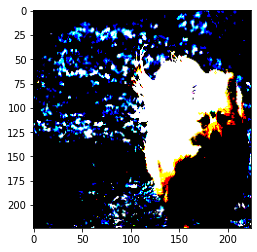

In [34]:
img1,img1_path = load_image(image_dir + '/3439243433_d5f3508612.jpg')  #3439243433_d5f3508612.jpg, 2258277193_586949ec62.jpg
print("Shape after resize :", img1.shape) 
print(img1_path)
plt.imshow(img1)

###**Functions for Image Augmentation**

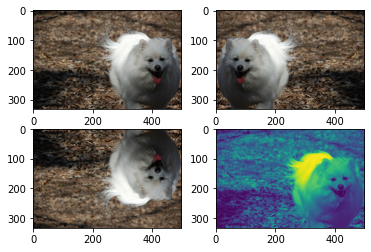

In [0]:
import imageio
def image_flipper(image):
  original_img = imageio.imread(image)
  plt.figure(1)

#Original Image

  plt.subplot(221)
  plt.imshow(original_img)

#Left-Right flip Image

  flipped_img_tensor = tf.image.flip_left_right(original_img)
  flipped_img= flipped_img_tensor.numpy()
  plt.subplot(222)
  plt.imshow(flipped_img)

#Up-Down flip Image

  upside_down_flip_tensor = tf.image.flip_up_down(original_img)
  upside_down_flip= upside_down_flip_tensor.numpy()
  plt.subplot(223)
  plt.imshow(upside_down_flip)

#Gray scale Image

  gray_tensor = tf.image.rgb_to_grayscale(original_img)
  grayimg= gray_tensor.numpy()
  plt.subplot(224)
  plt.imshow(tf.squeeze(grayimg))

  #plt.imsave('doggo.jpg',flipped_img)

image_flipper(image_dir + '/' + '3439243433_d5f3508612.jpg')

##**Image Histograms**
- Histogram is considered as a graph or plot which is related to frequency of pixels in an Gray Scale Image with pixel values (ranging from 0 to 255). 
- Grayscale image is an image in which the value of each pixel is a single sample, that is, it carries only intensity information where pixel value varies from 0 to 255

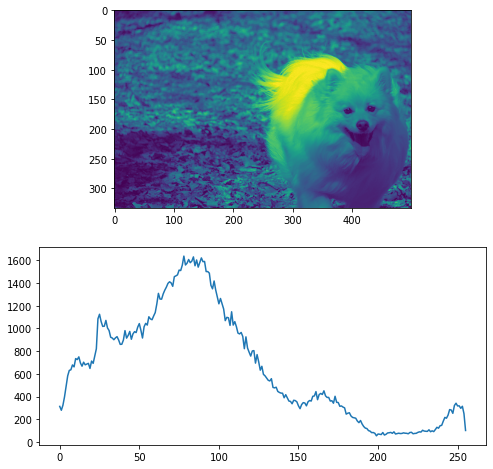

In [0]:
# importing required libraries of opencv 
import cv2 
# importing library for plotting 
from matplotlib import pyplot as plt 
def plot_image_histograms(image): 
  # reads an input image 
  img = cv2.imread(image,0) 
  # find frequency of pixels in range 0-255 
  histr = cv2.calcHist([img],[0],None,[256],[0,256]) 
    
  # show the plotting graph of an image 
  fig = plt.figure(figsize=(8, 8))
  plt.subplot(2,1,1)
  plt.imshow(img)
  plt.subplot(2,1,2)
  plt.plot(histr) 
  plt.show() 

plot_image_histograms(image_dir + '/' + '3439243433_d5f3508612.jpg')

##**Feature Extraction - VGG16**##
Create an VGG16 model as a feature extractor. This will create a 512 element vector as the output. Since, the top layer is not included, average pooling is applied at the end to convert from a 4D tensor to a 2D tensor.

In [25]:
# Pre-Trained Image Model (InceptionV3)
image_model = VGG16(include_top=False, weights='imagenet', input_shape=(224, 224, 3))

new_input = image_model.input # Any arbitrary shapes with 3 channels
hidden_layer = image_model.layers[-1].output

image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

image_features_extract_model.summary()

58892288/58889256 [==============================] - 1s 0us/step
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
______________________________________________________________

##**Features extractraction**

In [27]:
# Do not use default function - use specific Flikr8K train/dev/test data
# Create training and test set using an 80-20 split
# img_name_train, img_name_test, caption_train, caption_test = train_test_split(img_name_vector,train_captions,test_size=0.2,random_state=0)

img_name_train = img_name_vector
img_name_val = val_img_name_vector
img_name_test = test_img_name_vector

caption_train = train_captions
caption_val = val_captions
caption_test = test_captions

print("Training Data : X = {0}, Y = {1}".format(len(img_name_train), len(caption_train)))
print("Val Data      : X = {0},  Y = {1}".format(len(img_name_val), len(caption_val)))
print("Test Data     : X = {0},  Y = {1}".format(len(img_name_test), len(caption_test)))

Training Data : X = 30000, Y = 30000
Val Data      : X = 5000,  Y = 5000
Test Data     : X = 5000,  Y = 5000


##**Features extraction from VGG16**##
- create dataset where elements are slices of the given tensors
- Map each image name to the function to load the image

In [29]:
# Get unique images
encode_train = sorted(set(img_name_train))
encode_test = sorted(set(img_name_val))

print(encode_train[:5])
print(encode_test[:5])

# create dataset where elements are slices of the given tensors
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_data_test = tf.data.Dataset.from_tensor_slices(encode_test)

# Map each image name to the function to load the image
image_dataset = image_dataset.map(load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(64)
image_data_test = image_data_test.map(load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(64)

image_dataset

['/root/.keras/datasets/Flicker8k_Dataset/1000268201_693b08cb0e.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1001773457_577c3a7d70.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1002674143_1b742ab4b8.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1003163366_44323f5815.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1007129816_e794419615.jpg']
['/root/.keras/datasets/Flicker8k_Dataset/1022454332_6af2c1449a.jpg', '/root/.keras/datasets/Flicker8k_Dataset/103106960_e8a41d64f8.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1032122270_ea6f0beedb.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1034276567_49bb87c51c.jpg', '/root/.keras/datasets/Flicker8k_Dataset/1045521051_108ebc19be.jpg']


<BatchDataset shapes: ((None, 224, 224, 3), (None,)), types: (tf.float32, tf.string)>

##**NumPy array file**
An NPY file is a NumPy array file created by the Python software package with the NumPy library installed. It contains an array saved in the NumPy (NPY) file format. NPY files store all the information required to reconstruct an array on any computer, which includes dtype and shape information.

In [0]:
from tqdm import tqdm

# Training data
for img, path in image_dataset:
  batch_features = image_features_extract_model(img)
  batch_features = tf.reshape(batch_features,
                              (batch_features.shape[0], -1, batch_features.shape[3]))

  for bf, p in zip(batch_features, path):
    path_of_feature = p.numpy().decode("utf-8")
    np.save(path_of_feature, bf.numpy())


# TEST data
for img, path in image_data_test:
  batch_features = image_features_extract_model(img)
  batch_features = tf.reshape(batch_features,
                              (batch_features.shape[0], -1, batch_features.shape[3]))

  for bf, p in zip(batch_features, path):
    path_of_feature = p.numpy().decode("utf-8")
    np.save(path_of_feature, bf.numpy())


In [31]:
# check that above step worked correctly
np_img =np.load('/root/.keras/datasets/Flicker8k_Dataset/1000268201_693b08cb0e.jpg.npy')
print(np_img)
print("Shape : {}".format(np_img.shape))

[[ 0.         0.         0.        ...  0.        14.209737   0.       ]
 [ 0.         0.         0.        ...  0.         4.3780046  0.       ]
 [ 0.         0.         0.        ...  0.         0.         0.       ]
 ...
 [ 0.         3.336066   0.        ...  0.         0.         0.       ]
 [ 0.         0.         0.        ...  0.         0.         0.       ]
 [ 0.         0.         0.        ...  0.         0.         0.       ]]
Shape : (49, 512)


##**Data Preparation for a Language Generation(RNN) DECODER**
1. We will perform a few basic pre-processing steps on the captions such as:
First, we will tokenize the captions. This will help us to build a vocabulary of all the unique words in the data.
2. Next, we will limit the vocabulary size to top 5000 words to save memory. We will replace all the other words with the token < unk > (for words not in vocabulary) . You , can obviously optimize that according to the use cases.
3. Finally, we will create a word->index mapping and vice versa.
4. We will pad all sequences to be the same length as the longest one.

In [0]:
def tokenize_caption(top_k, train_captions):
  # Choose the top 5000 words from the vocabulary
  tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,
                                                    oov_token="<unk>",
                                                    filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
  # oov_token: if given, it will be added to word_index and used to replace out-of-vocabulary words during text_to_sequence calls
  
  tokenizer.fit_on_texts(train_captions)
  train_seqs = tokenizer.texts_to_sequences(train_captions)

  # Map '<pad>' to '0'
  tokenizer.word_index['<pad>'] = 0
  tokenizer.index_word[0] = '<pad>'

  # Create the tokenized vectors
  train_seqs = tokenizer.texts_to_sequences(train_captions)
  return train_seqs, tokenizer

train_seqs , tokenizer = tokenize_caption(5000, caption_train)

val_seqs , tokenizer_val = tokenize_caption(5000, caption_val)

test_seqs , tokenizer_test = tokenize_caption(5000, caption_test)


In [34]:
caption_test[:3]

['<start> blond woman in blue shirt appears to wait for ride <end>',
 '<start> blond woman is on the street hailing taxi <end>',
 '<start> woman is signaling is to traffic as seen from behind <end>']

In [33]:
test_seqs[:3]

[[2, 291, 19, 5, 28, 38, 775, 21, 1095, 76, 258, 3],
 [2, 291, 19, 7, 6, 4, 68, 1792, 1370, 3],
 [2, 19, 7, 1793, 7, 21, 625, 71, 776, 82, 117, 3]]

**MaxLength and MinLength of any captions**

In [40]:
# Find the maximum length of any caption in our dataset
def calc_max_length(tensor):
    return max(len(t) for t in tensor)

# Calculates the max_length, which is used to store the attention weights
max_length = calc_max_length(train_seqs)
max_length_val = calc_max_length(val_seqs)
max_length_test = calc_max_length(test_seqs)

# Find the maximum length of any caption in our dataset
def calc_min_length(tensor):
    return min(len(t) for t in tensor)

# Calculates the max_length, which is used to store the attention weights
min_length = calc_min_length(train_seqs)
min_length_val = calc_min_length(val_seqs)
min_length_test = calc_min_length(test_seqs)

print('Max Length of any (Train) caption : Min Length of any (Train) caption = '+ str(max_length) +" : "+str(min_length))
print('Max Length of any (Val)   caption : Min Length of any (Val)   caption = '+ str(max_length_val) +" : "+str(min_length_val))
print('Max Length of any (Test)  caption : Min Length of any (Test)  caption = '+ str(max_length_test) +" : "+str(min_length_test))


Max Length of any (Train) caption : Min Length of any (Train) caption = 34 : 3
Max Length of any (Val)   caption : Min Length of any (Val)   caption = 31 : 4
Max Length of any (Test)  caption : Min Length of any (Test)  caption = 30 : 3


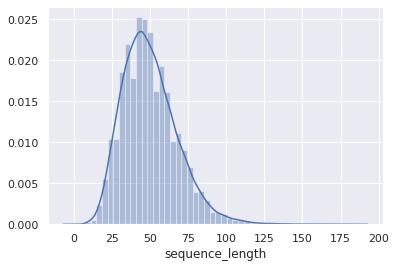

In [55]:
import seaborn as sns

df=pd.DataFrame()
df["sequence_length"] = data["caption"].apply(len)

sns.set()
distribution = sns.distplot(df["sequence_length"])

###**Pad each vector to the max_length of the captions, so that all caption vectors are of same length**###

In [41]:
def padding_train_sequences(train_seqs,max_length,padding_type):
  cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding=padding_type,maxlen=max_length)
  return cap_vector

padded_caption_vector = padding_train_sequences(train_seqs, max_length, 'post') 

padded_caption_val = padding_train_sequences(val_seqs, max_length_val, 'post') 

padded_caption_test = padding_train_sequences(test_seqs, max_length_val, 'post') 

padded_caption_vector

array([[  2,  58,  25, ...,   0,   0,   0],
       [  2,  11, 131, ...,   0,   0,   0],
       [  2,  15,   8, ...,   0,   0,   0],
       ...,
       [  2,  11,   7, ...,   0,   0,   0],
       [  2,  43,  10, ...,   0,   0,   0],
       [  2,  26,   1, ...,   0,   0,   0]], dtype=int32)

###**Creating the datasets**###

In [0]:
BATCH_SIZE = 64
BUFFER_SIZE = 1000

embedding_dim = 256
units = 512
vocab_size = len(tokenizer.word_index) + 1     #8768
num_steps = len(img_name_train) // BATCH_SIZE  #505

# Shape from last layer of VGG-16 :(7,7,512)
# So, say there are 49 pixel locations now and each pixel is 512 dimensional
features_shape = 512
attention_features_shape = 49

def load_npy(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8')+'.npy')
  return img_tensor, cap

'''
# How Dataset.from_tensor_slices work
t = tf.constant([[1, 2], [3, 4]])
ds = tf.data.Dataset.from_tensor_slices(t)   # [1, 2], [3, 4]
ds # <TensorSliceDataset shapes: (2,), types: tf.int32>
'''
def create_dataset(img_name_train, caption_train):
  dataset = tf.data.Dataset.from_tensor_slices((img_name_train, caption_train))

  # Use map to load the numpy files in parallel
  dataset = dataset.map(lambda item1, item2: tf.numpy_function(load_npy, [item1, item2], [tf.float32, tf.int32]),num_parallel_calls=tf.data.experimental.AUTOTUNE)

  # Shuffle and batch
  dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
  return dataset

# Creating train and test dataset (test from the Validation data)
dataset = create_dataset(img_name_train, padded_caption_vector)
test_dataset = create_dataset(img_name_val, padded_caption_val) 


###**CNN ENCODER:**###
Now, let's define the CNN ENCODER, that will be the single fully connected layer followed by ReLU activation.

In [0]:
# https://www.tensorflow.org/tutorials/text/image_captioning
class VGG16_Encoder(tf.keras.Model):
    # This encoder passes the features through a Fully connected layer
    def __init__(self, embedding_dim):
        super(VGG16_Encoder, self).__init__()
        # shape after fc == (batch_size, 49, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)
        self.dropout = tf.keras.layers.Dropout(0.5, noise_shape=None, seed=None)

    def call(self, x):
        #x= self.dropout(x)
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

In [0]:
def rnn_type(units):
  # If you have a GPU, we recommend using CuDNNGRU(provides a 3x speedup than GRU)
  # the code automatically does that.
    if tf.config.list_physical_devices('GPU'):
        return tf.compat.v1.keras.layers.CuDNNLSTM(units, 
                                        return_sequences=True, 
                                        return_state=True, 
                                        recurrent_initializer='glorot_uniform')
    else:
        return tf.keras.layers.GRU(units, 
                                   return_sequences=True, 
                                   return_state=True, 
                                   recurrent_activation='sigmoid', 
                                   recurrent_initializer='glorot_uniform')

###**RNN DECODER and BAHDANAU ATTENTION(LOCAL ATTENTION) MECHANISM:**
In the RNN Decoder we will also define the Attention Mechanism. We will need the features from the CNN ENCODER . This Attention Mechanism will return the context vector and attention weights over the time axis.

In [0]:
'''The encoder output(i.e. 'features'), hidden state(initialized to 0)(i.e. 'hidden') and 
the decoder input (which is the start token)(i.e. 'x') is passed to the decoder.'''

class Rnn_Local_Decoder(tf.keras.Model):
  def __init__(self, embedding_dim, units, vocab_size):
    super(Rnn_Local_Decoder, self).__init__()
    self.units = units

    self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
    self.gru = tf.keras.layers.GRU(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')
    
    self.fc1 = tf.keras.layers.Dense(self.units)

    self.dropout = tf.keras.layers.Dropout(0.5, noise_shape=None, seed=None)
    self.batchnormalization = tf.keras.layers.BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001, center=True, scale=True, beta_initializer='zeros', gamma_initializer='ones', moving_mean_initializer='zeros', moving_variance_initializer='ones', beta_regularizer=None, gamma_regularizer=None, beta_constraint=None, gamma_constraint=None)

    self.fc2 = tf.keras.layers.Dense(vocab_size)

    # Implementing Attention Mechanism 
    self.Uattn = tf.keras.layers.Dense(units)
    self.Wattn = tf.keras.layers.Dense(units)
    self.Vattn = tf.keras.layers.Dense(1)
    


  def call(self, x, features, hidden):
    
    # features shape ==> (64,49,256) ==> Output from ENCODER
    
    # hidden shape == (batch_size, hidden_size) ==>(64,512)
    # hidden_with_time_axis shape == (batch_size, 1, hidden_size) ==> (64,1,512)
    
    hidden_with_time_axis = tf.expand_dims(hidden, 1)
    
    # score shape == (64, 49, 1)
    # Attention Function
    '''e(ij) = f(s(t-1),h(j))'''
    ''' e(ij) = Vattn(T)*tanh(Uattn * h(j) + Wattn * s(t))'''
    score = self.Vattn(tf.nn.tanh(self.Uattn(features) + self.Wattn(hidden_with_time_axis)))
    # self.Uattn(features) : (64,49,512)
    # self.Wattn(hidden_with_time_axis) : (64,1,512)
    # tf.nn.tanh(self.Uattn(features) + self.Wattn(hidden_with_time_axis)) : (64,49,512)
    # self.Vattn(tf.nn.tanh(self.Uattn(features) + self.Wattn(hidden_with_time_axis))) : (64,49,1) ==> score
    # you get 1 at the last axis because you are applying score to self.Vattn
    
    
    # Then find Probability using Softmax
    '''attention_weights(alpha(ij)) = softmax(e(ij))'''
    attention_weights = tf.nn.softmax(score, axis=1)
    # attention_weights shape == (64, 49, 1)

    
    # Give weights to the different pixels in the image
    ''' C(t) = Summation(j=1 to T) (attention_weights * VGG-16 features) ''' 
    context_vector = attention_weights * features
    context_vector = tf.reduce_sum(context_vector, axis=1)
    # Context Vector(64,256) = AttentionWeights(64,49,1) * features(64,49,256)
    # context_vector shape after sum == (64, 256)
    
    # x shape after passing through embedding == (64, 1, 256)
    x = self.embedding(x)
    
    # x shape after concatenation == (64, 1,  512)
    x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

    # passing the concatenated vector to the GRU
    output, state = self.gru(x)

    # shape == (batch_size, max_length, hidden_size)
    x = self.fc1(output)

    # x shape == (batch_size * max_length, hidden_size)
    x = tf.reshape(x, (-1, x.shape[2]))

    # Adding Dropout and BatchNorm Layers
    x= self.dropout(x)
    x= self.batchnormalization(x)
    # output shape == (64 * 512)
    x = self.fc2(x)
    # shape : (64 * 8329(vocab))
    return x, state, attention_weights

  def reset_state(self, batch_size):
    return tf.zeros((batch_size, self.units))

In [0]:
#if(attention_choice=='local'):
encoder = VGG16_Encoder(embedding_dim)
decoder = Rnn_Local_Decoder(embedding_dim, units, vocab_size)

In [0]:
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')

def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_mean(loss_)

###**Saving Checkpoint**
- TensorFlow objects provide an easy automatic mechanism for saving and restoring the values of variables they use.
- All prefixes are grouped together in a single checkpoint file ('./tf_ckpts/checkpoint') where the CheckpointManager saves its state.

In [0]:
checkpoint_path_ckpt = "./checkpoints/train"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer = optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path_ckpt, max_to_keep=5)

start_epoch = 0
if ckpt_manager.latest_checkpoint:
  start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])

##**Training Step:**
- The ENCODER output, hidden state(initialised to 0) and the DECODER input(which is the < start > token) are passed to the DECODER.
- The DECODER returns the predictions and the DECODER hidden state.
- The DECODER hidden state is then passed back into the model and the predictions are used to calculate the loss. While training, we use the Teacher Forcing technique, to decide the next input of the DECODER.
- Teacher Forcing is the technique where the target word is passed as the next input to the DECODER. This technique helps to learn the correct sequence or correct statistical properties fro the sequence, quickly.
- Final step is to calculate the Gradient and apply it to the optimizer and backpropagate


###**Setup Tensorboard summary writer**###

In [0]:
# Clear previous logs
!rm -rf ./logs/

In [0]:
# Define our metrics
train_loss = tf.keras.metrics.Mean('train_loss', dtype=tf.float32)
# train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy('train_accuracy')

import datetime
current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
train_log_dir = 'logs/gradient_tape/' + current_time + '/train'
test_log_dir = 'logs/gradient_tape/' + current_time + '/test'
train_summary_writer = tf.summary.create_file_writer(train_log_dir)
test_summary_writer = tf.summary.create_file_writer(test_log_dir)

In [0]:
# adding this in a separate cell because if you run the training cell
# many times, the loss_plot array will be reset
loss_plot = []
test_loss_plot = []

In [0]:
@tf.function
def train_step(img_tensor, target):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)  #* BATCH_SIZE, target.shape[0]

  with tf.GradientTape() as tape:
      features = encoder(img_tensor)

      for i in range(1, target.shape[1]):
          # passing the features through the decoder
          #dec_input = tf.expand_dims(target[:, i], 1)
          predictions, hidden, _ = decoder(dec_input, features, hidden)

          loss += loss_function(target[:, i], predictions)

          # using teacher forcing
          dec_input = tf.expand_dims(target[:, i], 1)
          
  total_loss = (loss / int(target.shape[1]))

  trainable_variables = encoder.trainable_variables + decoder.trainable_variables

  gradients = tape.gradient(loss, trainable_variables)

  optimizer.apply_gradients(zip(gradients, trainable_variables))

  return loss, total_loss

In [0]:
@tf.function
def test_step(img_tensor, target):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims([tokenizer_val.word_index['<start>']] * target.shape[0], 1)  #* BATCH_SIZE , target.shape[0]

  features = encoder(img_tensor)

  for i in range(1, target.shape[1]):
      # passing the features through the decoder  
      predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
      
      loss += loss_function(target[:, i], predictions)
      
      predicted_id = tf.argmax(predictions[0])
      dec_input = tf.expand_dims([predicted_id]*target.shape[0], 1)
  
  total_loss = (loss / int(target.shape[1]))

  return loss, total_loss

##**Training**

In [54]:
# TRAINING
EPOCHS = 10

for epoch in range(start_epoch, EPOCHS):
    start = time()

    #For Train
    #================================================================
    total_loss_train = 0
    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss_train += t_loss

        #if batch % 250 == 0:
        #    print ('Epoch {} Batch {} Loss {:.4f}'.format(
        #      epoch + 1, batch, batch_loss.numpy() / int(target.shape[1])))
        
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss_train / num_steps)

    # Tensorboard 
    with train_summary_writer.as_default():
      tf.summary.scalar('LossPlotTrain', (total_loss_train / num_steps), step=epoch)
      tf.summary.scalar('Train_loss', train_loss.result(), step=epoch)

    #For Test (using Validation data)
    #================================================================
    total_loss_test = 0
    for (batch, (img_tensor, target)) in enumerate(test_dataset):
        batch_loss, t_loss = test_step(img_tensor, target)
        total_loss_test += t_loss

        #if batch % 250 == 0:
        #    print ('Epoch {} Batch {} Loss {:.4f}'.format(
        #      epoch + 1, batch, batch_loss.numpy() / int(target.shape[1])))

    # storing the epoch end loss value to plot later
    test_loss_plot.append(total_loss_test / num_steps) 

    # Tensorboard 
    with test_summary_writer.as_default():
      tf.summary.scalar('LossPlotTest', (total_loss_test/ num_steps), step=epoch)

    if epoch % 5 == 0:
      ckpt_manager.save()

    print ('Epoch {} TrainLoss {:.6f} TestLoss {:.6f}'.format(epoch + 1,(total_loss_train/num_steps),(total_loss_test/num_steps)))
    print ('Time taken for 1 epoch {} sec\n'.format(time() - start))


Epoch 1 TrainLoss 1.434728 TestLoss 0.415775
Time taken for 1 epoch 214.500994682312 sec

Epoch 2 TrainLoss 1.092616 TestLoss 0.444428
Time taken for 1 epoch 136.23734998703003 sec

Epoch 3 TrainLoss 0.969887 TestLoss 0.456452
Time taken for 1 epoch 135.77697777748108 sec

Epoch 4 TrainLoss 0.885848 TestLoss 0.471197
Time taken for 1 epoch 135.67013239860535 sec

Epoch 5 TrainLoss 0.817960 TestLoss 0.492818
Time taken for 1 epoch 135.73511743545532 sec

Epoch 6 TrainLoss 0.762111 TestLoss 0.507217
Time taken for 1 epoch 135.53184247016907 sec

Epoch 7 TrainLoss 0.712097 TestLoss 0.502690
Time taken for 1 epoch 135.85777235031128 sec

Epoch 8 TrainLoss 0.668689 TestLoss 0.527715
Time taken for 1 epoch 136.17325854301453 sec

Epoch 9 TrainLoss 0.630543 TestLoss 0.546573
Time taken for 1 epoch 135.46738839149475 sec

Epoch 10 TrainLoss 0.596412 TestLoss 0.543038
Time taken for 1 epoch 135.4908890724182 sec



In [55]:
# Launching Tensorboard
%load_ext tensorboard
%tensorboard --logdir logs/gradient_tape

<IPython.core.display.Javascript object>

In [56]:
ckpt_manager.checkpoints

['./checkpoints/train/ckpt-1', './checkpoints/train/ckpt-2']

In [57]:
ckpt.restore('./checkpoints/train/ckpt-1')

No handles with labels found to put in legend.


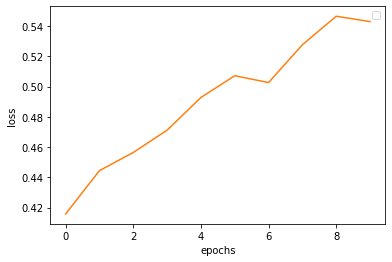

In [60]:
# Plot the Train and Validation Losses to check for overfitting
for label in [loss_plot, test_loss_plot]:
    plt.plot(label)
plt.legend()
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

##**Evaluating the Captioning Model**##
- The evaluate function is similar to the training loop, except we don't use Teacher Forcing here. The input to Decoder at each time step is its previous predictions, along with the hidden state and the ENCODER output.
- Few key points to remember while making predictions.
1. Stop predicting when the model predicts the end token.
2. Store the attention weights for every time step.

###**Evaluating Test Set - Greedy**
Evaluate all test images - how does the model perform

In [0]:
# Greedy Approach
def greedySearch(image):
    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer_test.word_index['<start>']], 0) # Start token is <start> for LSTM
    result = []     # need for plot_attention()

    for i in range(max_length_test):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        predicted_id = tf.argmax(predictions[0]).numpy()
        # carol fix maybe
        if tokenizer_test.index_word[predicted_id] != '<end>':
          # next line necessary for plot_attention()
          result.append(tokenizer_test.index_word[predicted_id]) # Store the result or word predicted
        
        if tokenizer_test.index_word[predicted_id] == '<end>': # if you reach <end> token then return the result
            return result

        dec_input = tf.expand_dims([predicted_id], 0) # Decoder input is the word predicted at previous timestep

    return result   

###**Greed - Overall Evaluation**###
Evaluation across all 1000 test images (5000 captions)

In [115]:
# cumulative BLEU scores
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
cc = SmoothingFunction()
bleu_1 = 0
bleu_2 = 0
bleu_3 = 0
bleu_4 = 0
i = 0
x = 0

nkeep = 5
pred_good, pred_bad, bleus = [], [], [] 

# during development, test=True to show print() steps
test = True

for img in range(len(img_name_test)):
  #next 3 lines during development only
  #x = x+1
  #if x % 1000 == 0:
    #print(img_name_test[img])

    image = img_name_test[img]  #encode_test[pic].reshape((1,512))   
    fname = image.rsplit('/',1)[1]
    if test==True:
      print(img, ',', fname)

    # Do prediction
    predicted = greedySearch(image) 

    # real_caption from caption_test[]
    real_caption = caption_test[img]
    first = real_caption.split(' ', 1)[1]
    real_caption = first.rsplit(' ', 1)[0]

    predicted_cap = ' '.join(predicted)
    if test==True:
      print('predicted: ' + predicted_cap)
      print('real cap : ' + real_caption)

    bleu    = sentence_bleu(real_caption, predicted_cap, weights=(1.0, 0, 0, 0), smoothing_function=cc.method4)
    bleu_1 += sentence_bleu(real_caption, predicted_cap, weights=(1.0, 0, 0, 0), smoothing_function=cc.method4)
    bleu_2 += sentence_bleu(real_caption, predicted_cap, weights=(0, 1.0, 0, 0), smoothing_function=cc.method4)
    bleu_3 += sentence_bleu(real_caption, predicted_cap, weights=(0, 0, 1.0, 0), smoothing_function=cc.method4)
    bleu_4 += sentence_bleu(real_caption, predicted_cap, weights=(0, 0, 0, 1.0), smoothing_function=cc.method4)
    
    i += 1

    if test==True:
      print(cap_id, bleu)

    if i % 500 == 0:
      print("Processed {} {} {} {} {}".format(i, bleu_1/i, bleu_2/i, bleu_3/i, bleu_4/i))

    bleus.append(bleu)
    if bleu > 0.7:# and len(pred_good) < nkeep:
        pred_good.append((bleu,img,fname,descriptions[fname],predicted_cap))
    elif bleu < 0.2:# and len(pred_bad) < nkeep:
        pred_bad.append((bleu,img,fname,descriptions[fname],predicted_cap))

#----------------------------------------------            
# Print out overall results for all Test images
print(' ')
print('Greedy Overall Evaluation')
print(f"BELU_1 score        : {bleu_1/i*100}")
print(f"BELU_2 score        : {bleu_2/i*100}")
print(f"BELU_3 score        : {bleu_3/i*100}")
print(f"BELU_4 score        : {bleu_4/i*100}")


0 , 1056338697_4f7d7ce270.jpg
predicted: man is beach on in mouth
real cap : blond woman in blue shirt appears to wait for ride
4 0.5
1 , 1056338697_4f7d7ce270.jpg
predicted: man is beach on in mouth
real cap : blond woman is on the street hailing taxi
4 0.4583333333333333
2 , 1056338697_4f7d7ce270.jpg
predicted: man is beach on in mouth
real cap : woman is signaling is to traffic as seen from behind
4 0.5
3 , 1056338697_4f7d7ce270.jpg
predicted: man is beach on in mouth
real cap : woman with blonde hair wearing blue tube top is waving on the side of the street
4 0.5
4 , 1056338697_4f7d7ce270.jpg
predicted: man is beach on in mouth
real cap : the woman in the blue dress is holding out her arm at oncoming traffic
4 0.5416666666666666
5 , 106490881_5a2dd9b7bd.jpg
predicted: in child black is to playing down is to playing down is to playing down is to playing down is to playing down is to playing down is to playing
real cap : boy in his blue swim shorts at the beach
4 0.09154929577464788


KeyboardInterrupt: ignored

In [0]:
pd.DataFrame(pred_good).to_csv('/content/drive/My Drive/' + 'pred_good.csv')

In [117]:
(img_name_test)

['/root/.keras/datasets/Flicker8k_Dataset/1056338697_4f7d7ce270.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/1056338697_4f7d7ce270.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/1056338697_4f7d7ce270.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/1056338697_4f7d7ce270.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/1056338697_4f7d7ce270.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/106490881_5a2dd9b7bd.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/106490881_5a2dd9b7bd.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/106490881_5a2dd9b7bd.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/106490881_5a2dd9b7bd.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/106490881_5a2dd9b7bd.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/1082379191_ec1e53f996.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/1082379191_ec1e53f996.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/1082379191_ec1e53f996.jpg',
 '/root/.keras/datasets/Flicker8k_Dataset/1082379191_ec1e53f996.jpg',
 '/root/.keras/datasets/F

Bad Caption


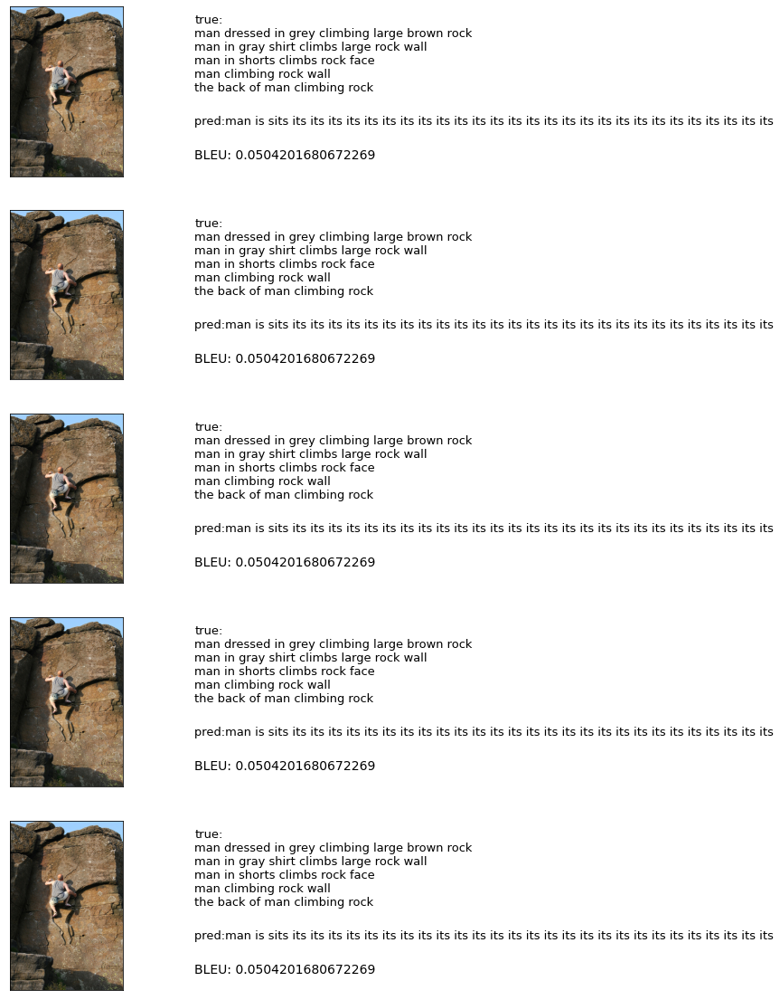

 
 
Good Caption


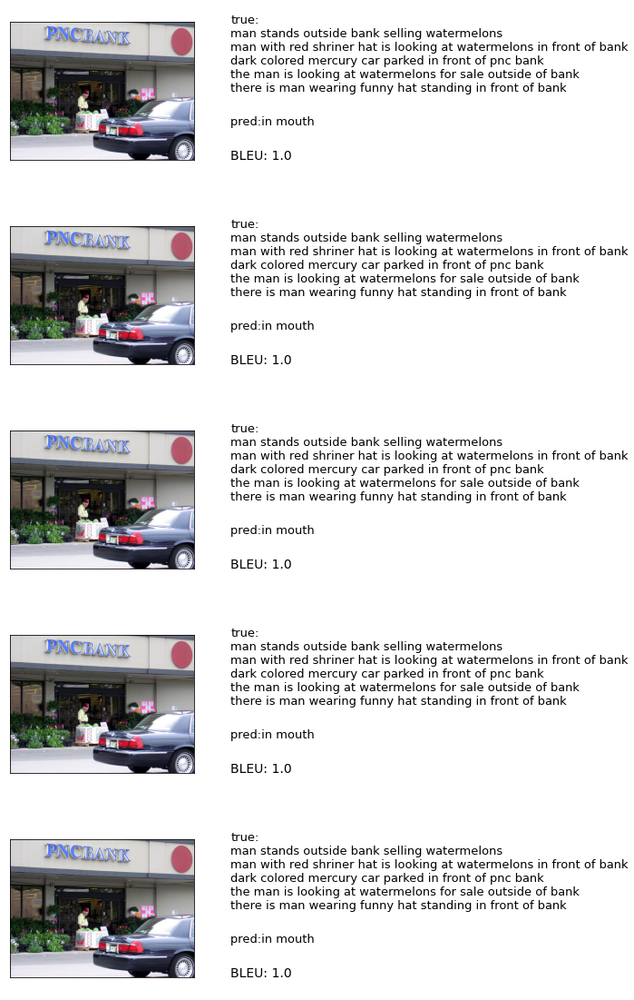

In [107]:
def plot_images(pred_bad, type='good', npic=5):
    def create_str(caption_true):
        strue = ""
        for s in list(caption_true):
            strue += "\n" + s
        return(strue)
    npix = 224
    target_size = (npix,npix,3)    
    count = 1
    pred = pred_bad.copy()
    pred.sort()

    # Either get top n (good) or bottom n (bad) images to show
    if type == 'good':
       pred = pred[-npic:]
    else:
       pred = pred[:npic]

    fig = plt.figure(figsize=(8,npic*4))
    
    for pb in pred:
        bleu,pic,actual,caption = pb
        ## images - get image from array, reshape and display in column 1
        image = img_name_test[pic]
        
        x=plt.imread(image)
        ax = fig.add_subplot(npic,2,count,xticks=[],yticks=[])
        ax.imshow(x)

        count += 1
        ## Text - get true descriptions, predicted and BLEU-1 score and display in column 2
        actual = create_str(actual) # Split the 5 descriptions to separate lines
        
        ax = fig.add_subplot(npic,2,count)
        plt.axis('off')
        ax.plot()
        ax.set_xlim(0,1)
        ax.set_ylim(0,1)

        fontsize=13
        ax.text(0,0.5,"true:" + actual, fontsize=fontsize)
        ax.text(0,0.3,"pred:" + caption,fontsize=fontsize)
        ax.text(0,0.1,"BLEU: {}".format(bleu),fontsize=fontsize+1)
        count += 1
    plt.show()

print("Bad Caption")
plot_images(pred_bad, 'bad')
print(' ')
print('=============================================')
print(' ')
print("Good Caption")
plot_images(pred_good, 'good')

##**Beam Search - Overall Evaluation**##
Evaluation across all 1000 test images (5000 captions)

In [0]:
# Greedy Approach
def evaluate_greedy(image):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0) # Start token is <start> for LSTM
    result = []     # need for plot_attention()
    result_cap = '' # required for BLUE assessment

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.argmax(predictions[0]).numpy()
        # carol fix maybe
        if tokenizer.index_word[predicted_id] != '<end>':
          # next line necessary for plot_attention()
          result.append(tokenizer.index_word[predicted_id]) # Store the result or word predicted
          # next line necessary for BLUE caption assessment
          result_cap = result_cap + ' ' + tokenizer.index_word[predicted_id]
        
        if tokenizer.index_word[predicted_id] == '<end>': # if you reach <end> token then return the result
            return result, attention_plot, result_cap

        dec_input = tf.expand_dims([predicted_id], 0) # Decoder input is the word predicted at previous timestep

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot, result_cap


In [0]:
# Beam Search
def evaluate_beam(image, beam_index = 3):

    start = [tokenizer.word_index['<start>']]
    
    # result[0][0] = index of the starting word
    # result[0][1] = probability of the word predicted
    result = [[start, 0.0]]

    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)

    while len(result[0][0]) < max_length:
        i=0
        temp = []
        for s in result:

          predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

          attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()
          i=i+1
          # Getting the top <beam_index>(n) predictions
          word_preds = np.argsort(predictions[0])[-beam_index:]
          
          # creating a new list so as to put them via the model again
          for w in word_preds:       
            next_cap, prob = s[0][:], s[1]
            next_cap.append(w)
            prob += predictions[0][w]
            temp.append([next_cap, prob])
        result = temp
        # Sorting according to the probabilities
        result = sorted(result, reverse=False, key=lambda l: l[1])
        # Getting the top words
        result = result[-beam_index:]
        
        predicted_id = result[-1] # with Max Probability
        pred_list = predicted_id[0]
        
        prd_id = pred_list[-1] 
        if(prd_id!=3):
          dec_input = tf.expand_dims([prd_id], 0)  # Decoder input is the word predicted with highest probability among the top_k words predicted
        else:
          break

    result = result[-1][0]
    
    intermediate_caption = [tokenizer.index_word[i] for i in result]
    final_caption = []
    for i in intermediate_caption:
        if i != '<end>':
            final_caption.append(i)
            
        else:
            break

    attention_plot = attention_plot[:len(result), :]
    final_caption = ' '.join(final_caption[1:])
    return final_caption,attention_plot

In [0]:
# Let's create a helper function to visualise the attention points that predicts the words.
def plot_attention(image, result, attention_plot):
    temp_image = np.array(Image.open(image))

    fig = plt.figure(figsize=(10, 10))
    len_result = len(result)
    #print('len_result: ' + str(len_result))
    for l in range(len_result):
        temp_att = np.resize(attention_plot[l], (8, 8))
        ax = fig.add_subplot(len_result//2, len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()

In [0]:
caption_test[1999]
tokenizer_test.index_word[1999]
test = caption_test[1999]
#real_caption = ' '.join([tokenizer_test.index_word[i] for i in test if i not in [0]])
real_caption = [d.split() for d in test]
real_caption

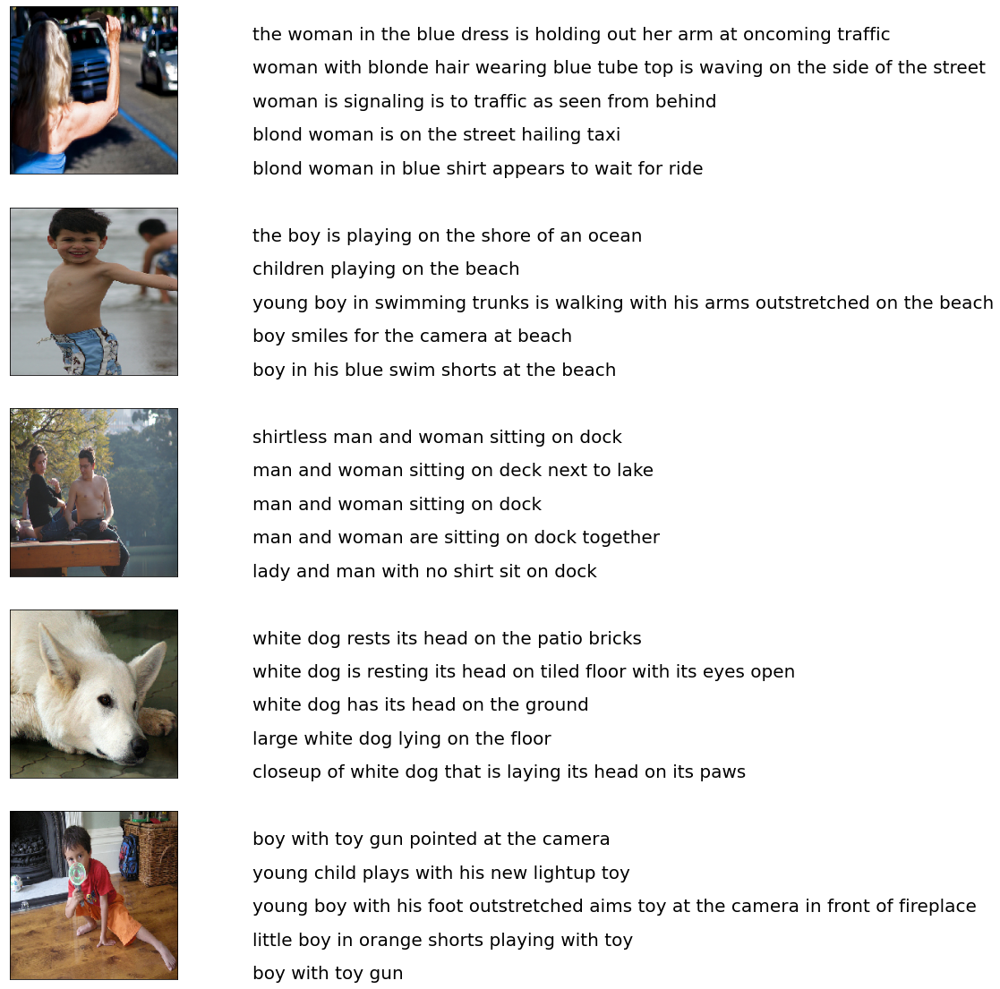

In [87]:
# Display some images with their captions
# Adapted from: https://fairyonice.github.io/Develop_an_image_captioning_deep_learning_model_using_Flickr_8K_data.html
from keras.preprocessing.image import load_img, img_to_array

def plot_image_caption(uni_filenames, data, npic=5, npix=224):
    target_size = (npix,npix,3)

    count = 1
    fig = plt.figure(figsize=(10,20))
    for jpgfnm in uni_filenames[:npic]:
        filename = image_dir + '/' + jpgfnm 
        captions = list(data["caption"].loc[data["filename"]==jpgfnm].values)
        image_load = load_img(filename, target_size=target_size)
        
        ax = fig.add_subplot(npic,2,count,xticks=[],yticks=[])
        ax.imshow(image_load)
        count += 1
        
        ax = fig.add_subplot(npic,2,count)
        plt.axis('off')
        ax.plot()
        ax.set_xlim(0,1)
        ax.set_ylim(0,len(captions))
        for i, caption in enumerate(captions):
            ax.text(0,i,caption,fontsize=20)
        count += 1
    plt.show()


#---------------------------------------------------
uni_filenames = np.unique(data_test['filename'])
npic = 5
npix = 224

plot_image_caption(uni_filenames, data_test, npic, npix,)

In [1]:
# cumulative BLEU scores
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
cc = SmoothingFunction()
bleu_1 = 0
bleu_2 = 0
bleu_3 = 0
bleu_4 = 0
i = 0
x = 0 # limit rows processed while developing

pred_good, pred_bad, bleus = [], [], [] 

x = 0
for img in range(len(img_name_test)):
  x = x+1
  if x % 2000 == 0: 
    #greedySearch(img)
    image = img_name_test[img]  #encode_test[pic].reshape((1,512))   
    fname = image.rsplit('/',1)[1]
    print(img, ',', fname)

    # Do prediction
    predicted = greedySearch(image) 

    #predicted = result.split()
    
    # real_caption from caption_test[]
    real_caption = caption_test[img]
    first = real_caption.split(' ', 1)[1]
    real_caption = first.rsplit(' ', 1)[0]

    predicted_cap = ' '.join(predicted)
    print('predicted: ' + predicted_cap)

    captions_all = descriptions[fname]
    for cap_id in range(len(captions_all)):
      real_caption = captions_all[cap_id]
      print('real cap : ' + real_caption)
      print(cap_id, sentence_bleu(real_caption, predicted_cap, weights=(1.0, 0, 0, 0), smoothing_function=cc.method4))
      bleu    = sentence_bleu(real_caption, predicted_cap, weights=(1.0, 0, 0, 0), smoothing_function=cc.method4)
      bleu_1 += sentence_bleu(real_caption, predicted_cap, weights=(1.0, 0, 0, 0), smoothing_function=cc.method4)
      bleu_2 += sentence_bleu(real_caption, predicted_cap, weights=(0, 1.0, 0, 0), smoothing_function=cc.method4)
      bleu_3 += sentence_bleu(real_caption, predicted_cap, weights=(0, 0, 1.0, 0), smoothing_function=cc.method4)
      bleu_4 += sentence_bleu(real_caption, predicted_cap, weights=(0, 0, 0, 1.0), smoothing_function=cc.method4)

      i += 1

    #if i % 200 == 0:
    print("Processed {} {} {} {} {}".format(i, bleu_1/i, bleu_2/i, bleu_3/i, bleu_4/i))

    bleus.append(bleu)
    if bleu > 0.8:# and len(pred_good) < nkeep:
        pred_good.append((bleu,img,descriptions[fname],caption))
    elif bleu < 0.2:# and len(pred_bad) < nkeep:
        pred_bad.append((bleu,img,descriptions[fname],caption))
            
    print(' ')

print('Overall evaluation Greedy')
print(f"BELU_1 score        : {bleu_1/i*100}")
print(f"BELU_2 score        : {bleu_2/i*100}")
print(f"BELU_3 score        : {bleu_3/i*100}")
print(f"BELU_4 score        : {bleu_4/i*100}")


NameError: ignored

###**Prediction and Evaluation Function for both Evaluation types: greedy & beam**##

In [0]:
# 1) Let's checkout few captions generated using Greedy Search vs Beam Search
# test image = '3445428367_25bafffe75.jpg' => black dog is digging in the snow
# test rid = 5994 => the blond girl is jumping up in the air

from PIL import Image
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
import re
warnings.filterwarnings("ignore")

def image_cap_predict(eval_type='greedy', beam_index=5, rid=5994, image='413231421_43833a11f5.jpg'):

    if rid==5994 and image=='413231421_43833a11f5.jpg':
      # pick random id, as no image id or name passed
      rid = np.random.randint(0, len(img_name_test))
      image = img_name_test[rid]
    elif rid!=5994:
      # use image id passed in   
      image = img_name_test[rid]
    else:
      # use image name passed in
      image = image_dir + '/' + image

    print(image)
    start = time()
    real_caption = ' '.join([tokenizer.index_word[i] for i in caption_test[rid] if i not in [0]])
    result_cap = ''

    if eval_type == 'greedy':
      # Greedy evaluation method
      result, attention_plot, result_cap = evaluate_greedy(image)
    else:
      result, attention_plot = evaluate_beam(image, beam_index)

    print('len(attention_plot) = ' + str(len(attention_plot)))

    # result is in this format:  ['woman', 'plays', 'volleyball', '<end>']
    # We need to remove <end> and join the list elements into a sentence. Also we need to remove <unk> from real_captions

    first = real_caption.split(' ', 1)[1]
    real_caption = first.rsplit(' ', 1)[0]

    #remove "<unk>" in result
    for i in result:
        if i=="<unk>":
            result.remove(i)

    #remove "<end>" in result_cap
    result_cap = re.sub('<end>', '', result_cap)

    #remove <end> from result         
    result_join = ''.join(str(result))
    result_final = result_join.rsplit(' ', 1)[0]

    real_appn = []
    real_appn.append(real_caption.split())
    reference = real_appn
    candidate = result_final.split()

    print(f'Evaulation method   : {eval_type}')
    print ('Real Caption        :', real_caption)

    cc = SmoothingFunction()
    bleu_1 = 0
    bleu_2 = 0
    bleu_3 = 0
    bleu_4 = 0

    if eval_type=='greedy':
      #score = sentence_bleu(real_caption, result_cap.strip(), weights=(0.5, 0.5, 0, 0))
      #bleu    = sentence_bleu(real_caption, result_cap.strip(), weights=(1.0, 0, 0, 0), smoothing_function=cc.method4)
      bleu_1 += sentence_bleu(real_caption, result_cap.strip(), weights=(0.5, 0.5, 0, 0), smoothing_function=cc.method4)
      bleu_2 += sentence_bleu(real_caption, result_cap.strip(), weights=(0, 1.0, 0, 0), smoothing_function=cc.method4)
      bleu_3 += sentence_bleu(real_caption, result_cap.strip(), weights=(0, 0, 1.0, 0), smoothing_function=cc.method4)
      bleu_4 += sentence_bleu(real_caption, result_cap.strip(), weights=(0, 0, 0, 1.0), smoothing_function=cc.method4)
      print('Prediction Caption  :', result_cap.strip())
    else:
      #score = sentence_bleu(reference, candidate, weights=(0.5, 0.5, 0, 0))
      #bleu    = sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=cc.method4)
      bleu_1 += sentence_bleu(reference, candidate, weights=(1.0, 0, 0, 0), smoothing_function=cc.method4)
      bleu_2 += sentence_bleu(reference, candidate, weights=(0, 1.0, 0, 0), smoothing_function=cc.method4)
      bleu_3 += sentence_bleu(reference, candidate, weights=(0, 0, 1.0, 0), smoothing_function=cc.method4)
      bleu_4 += sentence_bleu(reference, candidate, weights=(0, 0, 0, 1.0), smoothing_function=cc.method4)
      print(f'Prediction Caption  :', result_final)

    print(f"BELU_1 score        : {bleu_1*100}")
    print(f"BELU_2 score        : {bleu_2*100}")
    print(f"BELU_3 score        : {bleu_3*100}")
    print(f"BELU_4 score        : {bleu_4*100}")
    print(f"time took to Predict: {round(time()-start)} sec")
    print(f'image id            : {rid}')

    if eval_type=='greedy':
      plot_attention(image, result, attention_plot)
    else:
      plot_attention(image, candidate, attention_plot) #candidate

    return image, rid


In [0]:
# TEST 1.A - GREEDY
image, rid = image_cap_predict(eval_type='greedy', rid=6542)
# opening the image, does not work inside the function
Image.open(image)

/root/.keras/datasets/Flicker8k_Dataset/2857558098_98e9249284.jpg
len(attention_plot) = 34
Evaulation method   : beam
Real Caption        : little dog chews on big stick
Prediction Caption  : the dog is running in the grass is running on the grass is running on the grass is running on the grass is running on the grass is running on the grass
BELU_1 score        : 15.995778561279042
BELU_2 score        : 40.93838908503587
BELU_3 score        : 29.04701079017974
BELU_4 score        : 22.50885984287376
time took to Predict: 2 sec
image id            : 6542
len_result: 32


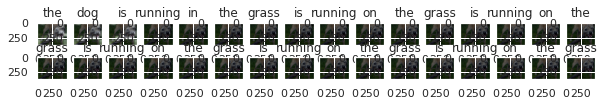

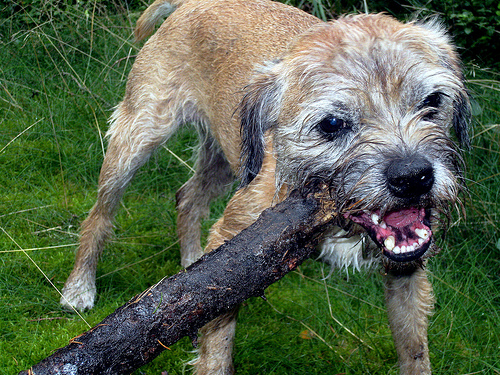

In [97]:
# TEST 1.B - BEAM (3)
image, rid = image_cap_predict(eval_type='beam', beam_index=3, rid=6542)
# opening the image, does not work inside the function
Image.open(image)

/root/.keras/datasets/Flicker8k_Dataset/2857558098_98e9249284.jpg
len(attention_plot) = 34
Evaulation method   : beam
Real Caption        : little dog chews on big stick
Prediction Caption  : brown dog is running in the brown dog is running in the brown dog is running in the brown dog is running in the brown dog is running in the brown dog
BELU_1 score        : 11.310723491038807
BELU_2 score        : 40.93838908503587
BELU_3 score        : 29.04701079017974
BELU_4 score        : 22.50885984287376
time took to Predict: 5 sec
image id            : 6542
len_result: 32


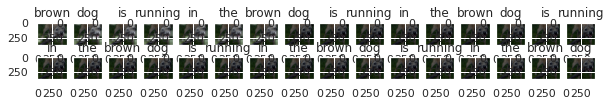

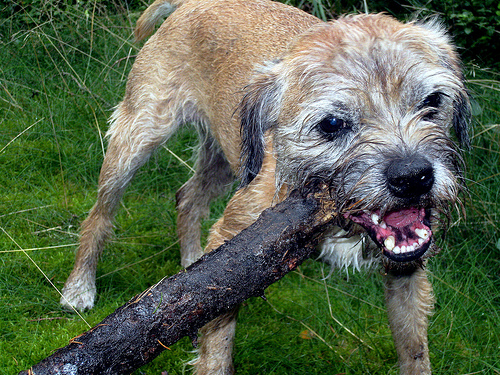

In [98]:
# TEST 1.C - BEAM (7)
image, rid = image_cap_predict(eval_type='beam', beam_index=7, rid=6542)
# opening the image, does not work inside the function
Image.open(image)

/root/.keras/datasets/Flicker8k_Dataset/2857558098_98e9249284.jpg
len(attention_plot) = 34
Evaulation method   : beam
Real Caption        : little dog chews on big stick
Prediction Caption  : brown dog is running in the brown dog is running in the brown dog is running in the brown dog is running in the brown dog is running in the brown dog
BELU_1 score        : 11.310723491038807
BELU_2 score        : 40.93838908503587
BELU_3 score        : 29.04701079017974
BELU_4 score        : 22.50885984287376
time took to Predict: 12 sec
image id            : 6542
len_result: 32


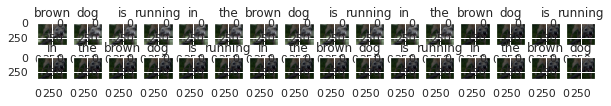

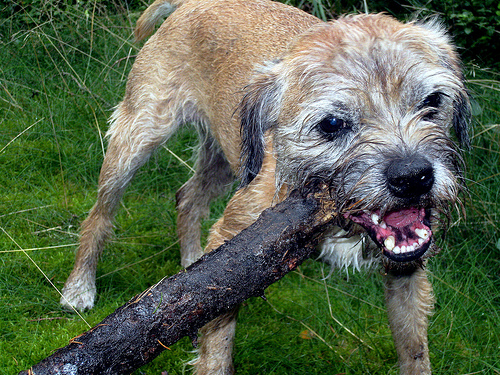

In [84]:
# TEST 1.D - BEAM (12)
image, rid = image_cap_predict(eval_type='beam', beam_index=12, rid=6542)
# opening the image, does not work inside the function
Image.open(image)

/root/.keras/datasets/Flicker8k_Dataset/3255620561_7644747791.jpg
len(attention_plot) = 34
Evaulation method   : greedy
Real Caption        : snow covered wooded area with structure and person in white top and orange pants in midair
Prediction Caption  : the skier jumps high in the snow covered in the woods
BELU_1 score        : 37.67857395322849
BELU_2 score        : 44.26045386052478
BELU_3 score        : 30.68093346172131
BELU_4 score        : 23.47774281143185
time took to Predict: 0 sec
image id            : 5397
len_result: 11


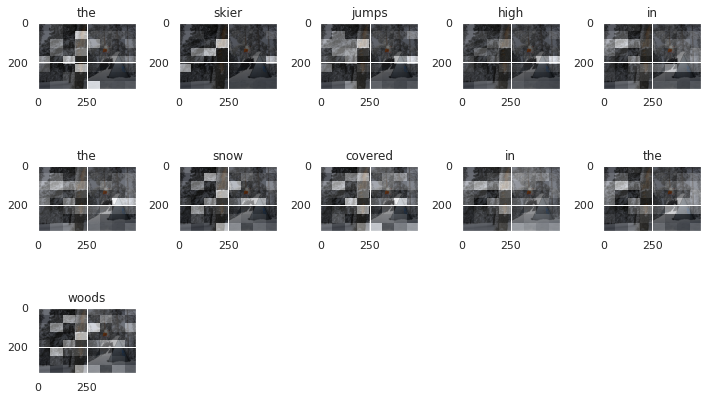

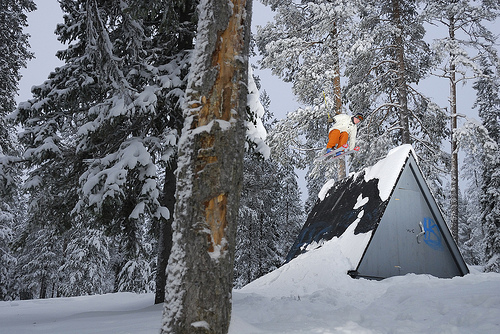

In [200]:
# TEST 2.A - Greedy
image, rid = image_cap_predict(eval_type='greedy', rid=5397)
# opening the image, does not work inside the function
Image.open(image)

In [0]:
# Let's create a helper function to visualise the attention points that predicts the words.
def plot_attention(image, result, attention_plot):
    temp_image = np.array(Image.open(image))

    fig = plt.figure(figsize=(10, 10))
    len_result = len(result)
    print('len_result: ' + str(len_result))
    for l in range(len_result):
        temp_att = np.resize(attention_plot[l], (8, 8))
        ax = fig.add_subplot(len_result//2, len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()

Test 2B - Beam=3
/root/.keras/datasets/Flicker8k_Dataset/3255620561_7644747791.jpg
len(attention_plot) = 12
Evaulation method   : beam
Real Caption        : snow covered wooded area with structure and person in white top and orange pants in midair
Prediction Caption  : snowboarder skier jumps off the snow covered in the
BELU_1 score        : 15.314194134530887
BELU_2 score        : 5.742822800449084
BELU_3 score        : 10.745299648916781
BELU_4 score        : 8.70850694535343
time took to Predict: 1 sec
image id            : 5397


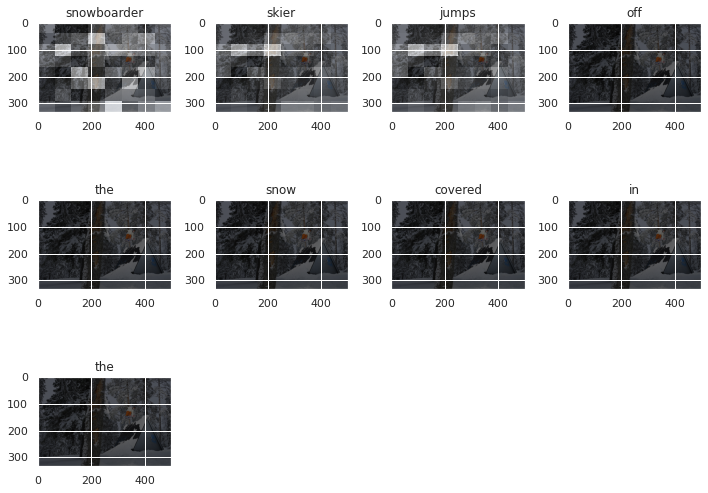

Test 2C - Beam=3
/root/.keras/datasets/Flicker8k_Dataset/3255620561_7644747791.jpg
len(attention_plot) = 12
Evaulation method   : beam
Real Caption        : snow covered wooded area with structure and person in white top and orange pants in midair
Prediction Caption  : snowboarder skier jumps off the snow covered in the
BELU_1 score        : 15.314194134530887
BELU_2 score        : 5.742822800449084
BELU_3 score        : 10.745299648916781
BELU_4 score        : 8.70850694535343
time took to Predict: 1 sec
image id            : 5397


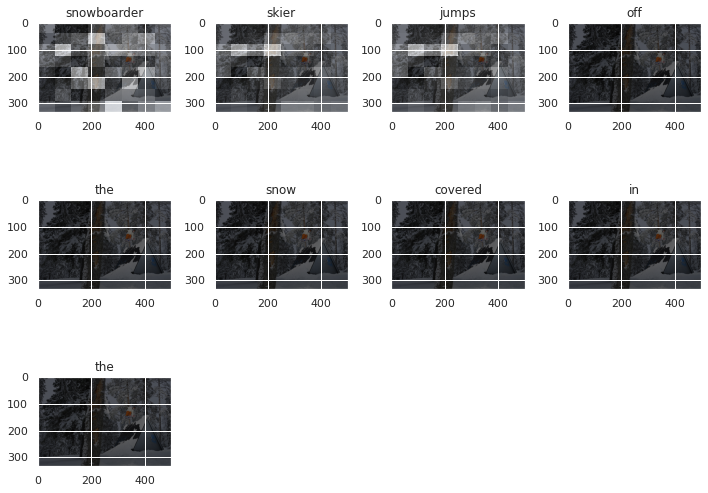

In [209]:
# TEST 2.B-D - BEAM 
print('Test 2B - Beam=3')
image, rid = image_cap_predict(eval_type='beam', beam_index=3, rid=5397)

print('Test 2C - Beam=3')
image, rid = image_cap_predict(eval_type='beam', beam_index=3, rid=5397)


Test 3A - Greedy
/root/.keras/datasets/Flicker8k_Dataset/2506892928_7e79bec613.jpg
len(attention_plot) = 34
Evaulation method   : greedy
Real Caption        : three kids palying with toy cat in garden
Prediction Caption  : two young girl in the camera
BELU_1 score        : 44.71681527801788
BELU_2 score        : 39.99187137216747
BELU_3 score        : 28.56728107151975
BELU_4 score        : 22.219713159857726
time took to Predict: 0 sec
image id            : 2966
len_result: 7


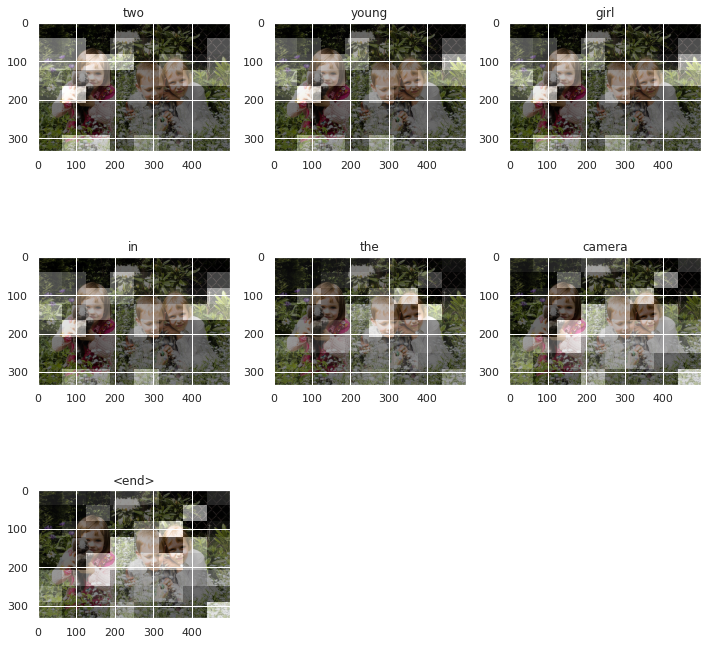

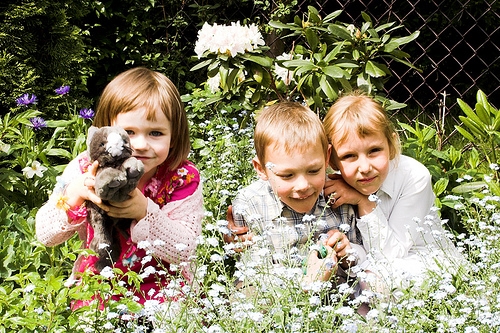

In [93]:
print('Test 3A - Greedy')
image, rid = image_cap_predict(eval_type='greedy', rid=2966)
# opening the image, does not work inside the function
Image.open(image)

Test 3B - Beam=2
/root/.keras/datasets/Flicker8k_Dataset/2506892928_7e79bec613.jpg
len(attention_plot) = 9
Evaulation method   : beam
Real Caption        : three kids <unk> with toy cat in garden
Prediction Caption  : two boys are surrounded by wildflowers
BELU_1 score        : 0
BELU_2 score        : 0
BELU_3 score        : 0
BELU_4 score        : 0
time took to Predict: 0 sec
image id            : 2966


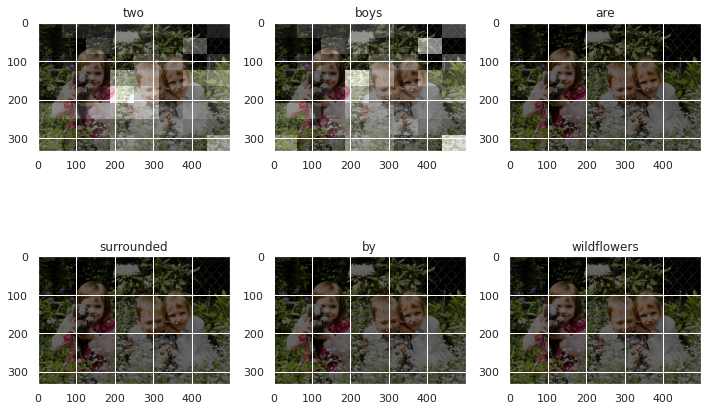

Test 3C - Beam=4
/root/.keras/datasets/Flicker8k_Dataset/2506892928_7e79bec613.jpg
len(attention_plot) = 34
Evaulation method   : beam
Real Caption        : three kids <unk> with toy cat in garden
Prediction Caption  : two young are field of flowers
BELU_1 score        : 0
BELU_2 score        : 0
BELU_3 score        : 0
BELU_4 score        : 0
time took to Predict: 3 sec
image id            : 2966


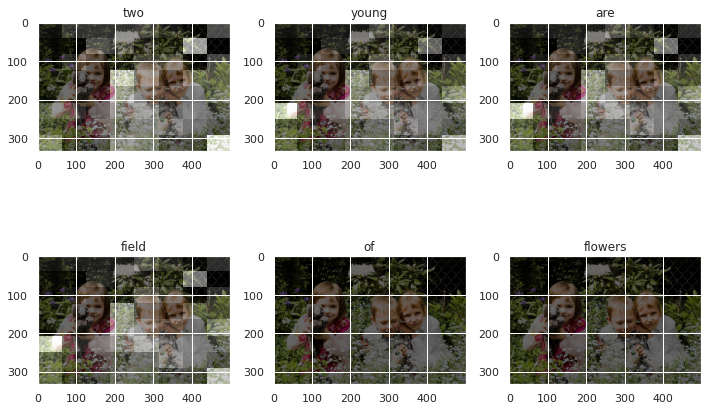

Test 3D - Beam=6
/root/.keras/datasets/Flicker8k_Dataset/2506892928_7e79bec613.jpg
len(attention_plot) = 9
Evaulation method   : beam
Real Caption        : three kids <unk> with toy cat in garden
Prediction Caption  : two children in field of flower
BELU_1 score        : 11.942188509563156
BELU_2 score        : 18.903080513022005
BELU_3 score        : 14.957172809009933
BELU_4 score        : 12.374142748479171
time took to Predict: 1 sec
image id            : 2966


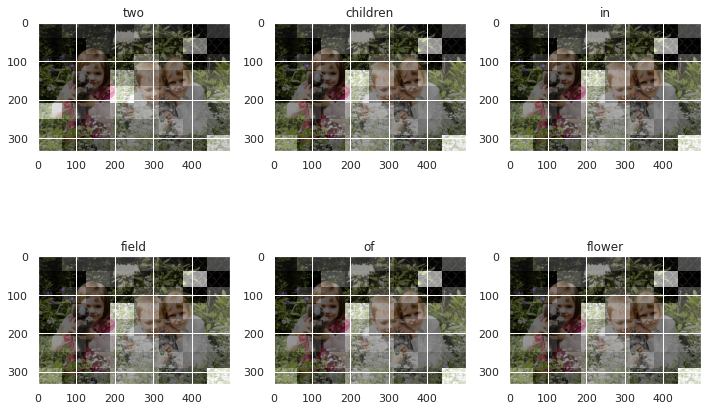

In [210]:
print('Test 3B - Beam=2')
image, rid = image_cap_predict(eval_type='beam', beam_index=2, rid=2966)

print('Test 3C - Beam=4')
image, rid = image_cap_predict(eval_type='beam', beam_index=4, rid=2966)

print('Test 3D - Beam=6')
image, rid = image_cap_predict(eval_type='beam', beam_index=6, rid=2966)

# opening the image, does not work inside the function
#Image.open(image)

Test 4A - Greedy
/root/.keras/datasets/Flicker8k_Dataset/498957941_f0eda42787.jpg
len(attention_plot) = 34
Evaulation method   : greedy
Real Caption        : boy in blue shirt is running
Prediction Caption  : the boy running across the background
BELU_1 score        : 38.38441246195499
BELU_2 score        : 41.93418110910073
BELU_3 score        : 29.544807868984797
BELU_4 score        : 22.806632203171702
time took to Predict: 0 sec
image id            : 1901


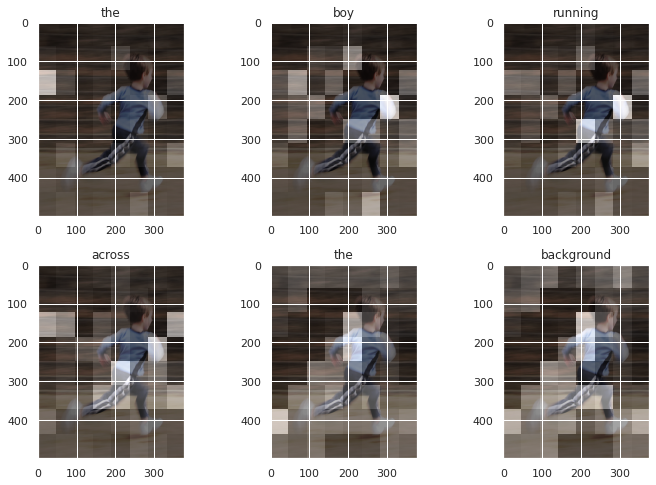

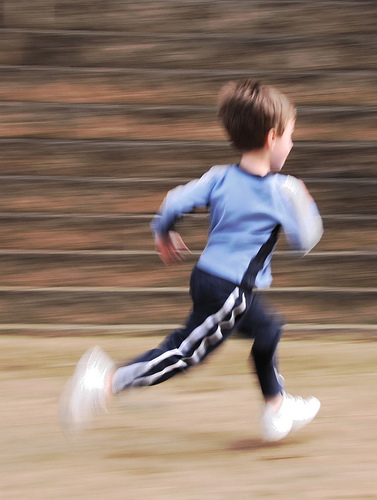

In [211]:
print('Test 4A - Greedy')
image, rid = image_cap_predict(eval_type='greedy', rid=1901)
# opening the image, does not work inside the function
Image.open(image)

Test 4B - Beam=3
/root/.keras/datasets/Flicker8k_Dataset/498957941_f0eda42787.jpg
len(attention_plot) = 9
Evaulation method   : beam
Real Caption        : boy in blue shirt is running
Prediction Caption  : boy boy is running on the
BELU_1 score        : 31.6227766016838
BELU_2 score        : 20.0
BELU_3 score        : 20.874416216414073
BELU_4 score        : 17.269507369566465
time took to Predict: 0 sec
image id            : 1901
len_result: 6


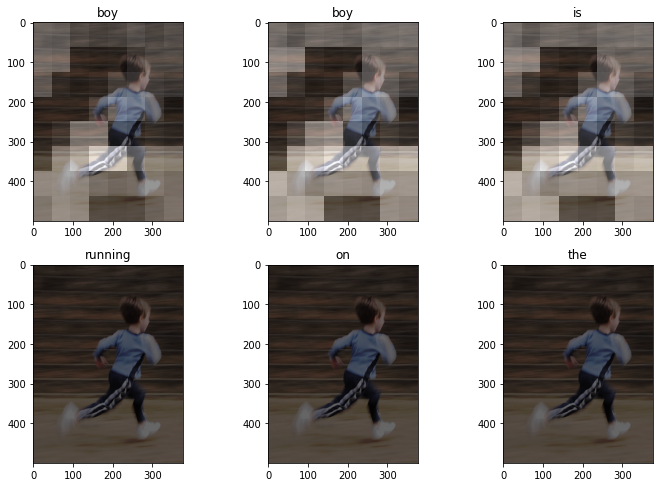

Test 4C - Beam=6
/root/.keras/datasets/Flicker8k_Dataset/498957941_f0eda42787.jpg
len(attention_plot) = 9
Evaulation method   : beam
Real Caption        : boy in blue shirt is running
Prediction Caption  : little boy is running on the
BELU_1 score        : 31.6227766016838
BELU_2 score        : 20.0
BELU_3 score        : 20.874416216414073
BELU_4 score        : 17.269507369566465
time took to Predict: 1 sec
image id            : 1901
len_result: 6


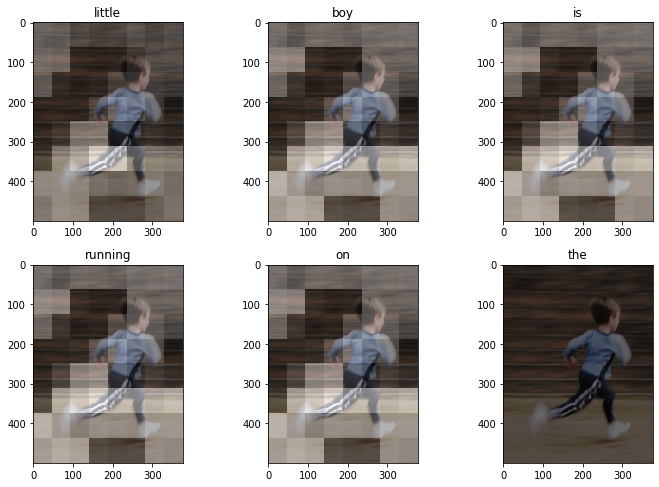

In [88]:
print('Test 4B - Beam=3')
image, rid = image_cap_predict(eval_type='beam', beam_index=3, rid=1901)

print('Test 4C - Beam=6')
image, rid = image_cap_predict(eval_type='beam', beam_index=5, rid=1901)

In [212]:

data['filename']

0        1000268201_693b08cb0e.jpg
1        1000268201_693b08cb0e.jpg
2        1000268201_693b08cb0e.jpg
3        1000268201_693b08cb0e.jpg
4        1000268201_693b08cb0e.jpg
                   ...            
40455     997722733_0cb5439472.jpg
40456     997722733_0cb5439472.jpg
40457     997722733_0cb5439472.jpg
40458     997722733_0cb5439472.jpg
40459     997722733_0cb5439472.jpg
Name: filename, Length: 40455, dtype: object